<img align="left" src="images/GMIT-logo.png" alt="GMIT" width="250"/>                                                      <img align="right" src="images/data-analytics.png" alt="HDipDA" width="300"/>  
# <center> Higher Diploma in Data Analytics - Boston House Prices Project </center> #
  

___________________________________________

**Module Name**: Machine Learning & Statistics  
**Module Number**: 52954
**Student Name**: Yvonne Brady  
**Student ID**: G00376355  
___________________________________________  


## (20%) Describe: ##
Create a git repository and make it available online for the lecturer to clone. The repository should contain all your work for this assessment. Within the repository, create a jupyter [6] notebook that uses descriptive statistics and plots to describe the Boston House Prices [1] dataset. This part is worth 20% of your overall mark.

## Introduction ##
This project concerns the Boston House Price Dataset. This dataset is taken from 1970 and records a number of parameters as follows:

**_crim_** : per capita crime rate by town.

**_zn_** : proportion of residential land zoned for lots over 25,000 sq.ft.

**_indus_** : proportion of non-retail business acres per town.

**_chas_** : Charles River dummy variable (= 1 if tract bounds river; 0 otherwise).

**_nox_** : nitrogen oxides concentration (parts per 10 million).

**_rm_** : average number of rooms per dwelling.

**_age_** : proportion of owner-occupied units built prior to 1940.

**_dis_** : weighted mean of distances to five Boston employment centres.

**_rad_** : index of accessibility to radial highways.

**_tax_** : full-value property-tax rate per $10,000.

**_ptratio_** : pupil-teacher ratio by town.

**_black_** : 1000(Bk - 0.63)^2 where Bk is the proportion of blacks by town.

**_lstat_** : lower status of the population (percent).

**_medv_** : median value of owner-occupied homes in $1000s.

In [1]:
# First things first - import the libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as ts ## not ~available and warnings when tried to install - will wait for now
%matplotlib inline 
# Found this and thought it was worth trying ...
import pandas_profiling

In [2]:
from sklearn.datasets import load_boston
bhp = load_boston()

In [3]:
print(bhp.keys())

dict_keys(['data', 'target', 'feature_names', 'DESCR', 'filename'])


In [4]:
bhp.DESCR

".. _boston_dataset:\n\nBoston house prices dataset\n---------------------------\n\n**Data Set Characteristics:**  \n\n    :Number of Instances: 506 \n\n    :Number of Attributes: 13 numeric/categorical predictive. Median Value (attribute 14) is usually the target.\n\n    :Attribute Information (in order):\n        - CRIM     per capita crime rate by town\n        - ZN       proportion of residential land zoned for lots over 25,000 sq.ft.\n        - INDUS    proportion of non-retail business acres per town\n        - CHAS     Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)\n        - NOX      nitric oxides concentration (parts per 10 million)\n        - RM       average number of rooms per dwelling\n        - AGE      proportion of owner-occupied units built prior to 1940\n        - DIS      weighted distances to five Boston employment centres\n        - RAD      index of accessibility to radial highways\n        - TAX      full-value property-tax rate per $10,000

In [67]:
bhp.data

array([[6.3200e-03, 1.8000e+01, 2.3100e+00, ..., 1.5300e+01, 3.9690e+02,
        4.9800e+00],
       [2.7310e-02, 0.0000e+00, 7.0700e+00, ..., 1.7800e+01, 3.9690e+02,
        9.1400e+00],
       [2.7290e-02, 0.0000e+00, 7.0700e+00, ..., 1.7800e+01, 3.9283e+02,
        4.0300e+00],
       ...,
       [6.0760e-02, 0.0000e+00, 1.1930e+01, ..., 2.1000e+01, 3.9690e+02,
        5.6400e+00],
       [1.0959e-01, 0.0000e+00, 1.1930e+01, ..., 2.1000e+01, 3.9345e+02,
        6.4800e+00],
       [4.7410e-02, 0.0000e+00, 1.1930e+01, ..., 2.1000e+01, 3.9690e+02,
        7.8800e+00]])

### Just Prettying up the Description ###
**Data Set Characteristics:**  
Number of Instances: 506  
Number of Attributes: 13  
**Numeric/categorical predictive.**  
Median Value (attribute 14) is usually the target.  
**Attribute Information (in order):**  
- CRIM     per capita crime rate by town  
- ZN       proportion of residential land zoned for lots over 25,000 sq.ft.  
- INDUS    proportion of non-retail business acres per town  
- CHAS     Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)  
- NOX      nitric oxides concentration (parts per 10 million)  
- RM       average number of rooms per dwelling  
- AGE      proportion of owner-occupied units built prior to 1940  
- DIS      weighted distances to five Boston employment centres  
- RAD      index of accessibility to radial highways  
- TAX      full-value property-tax rate per \\$10,000  
- PTRATIO  pupil-teacher ratio by town  
- B        1000(Bk - 0.63)^2 where Bk is the proportion of blacks by town  
- LSTAT    % lower status of the population  
- MEDV     Median value of owner-occupied homes in $1000's

**Missing Attribute Values:** None  

**Creator:** Harrison, D. and Rubinfeld, D.L.  
This is a copy of UCI ML housing dataset.
https://archive.ics.uci.edu/ml/machine-learning-databases/housing/  
This dataset was taken from the StatLib library which is maintained at Carnegie Mellon University.  
The Boston house-price data of Harrison, D. and Rubinfeld, D.L. 'Hedonic prices and the demand for clean air', J. Environ. Economics & Management, vol.5, 81-102, 1978.   Used in Belsley, Kuh & Welsch, 'Regression diagnostics...', Wiley, 1980.  
N.B. Various transformations are used in the table on pages 244-261 of the latter.  
The Boston house-price data has been used in many machine learning papers that address regression problems.  

**References**  
- Belsley, Kuh & Welsch, 'Regression diagnostics: Identifying Influential Data and Sources of Collinearity', Wiley, 1980. 244-261.  
- Quinlan,R. (1993). Combining Instance-Based and Model-Based Learning. In Proceedings on the Tenth International Conference of Machine Learning, 236-243, University of Massachusetts, Amherst. Morgan Kaufmann.

In [5]:
# Put the data in a dataframe for easier manipulation
boston = pd.DataFrame(bhp.data, columns=bhp.feature_names)
# And have a look at some random data
boston.sample(5)

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
33,1.15172,0.0,8.14,0.0,0.538,5.701,95.0,3.7872,4.0,307.0,21.0,358.77,18.35
195,0.01381,80.0,0.46,0.0,0.422,7.875,32.0,5.6484,4.0,255.0,14.4,394.23,2.97
389,8.15174,0.0,18.10,0.0,0.700,5.390,98.9,1.7281,24.0,666.0,20.2,396.90,20.85
65,0.03584,80.0,3.37,0.0,0.398,6.290,17.8,6.6115,4.0,337.0,16.1,396.90,4.67
335,0.03961,0.0,5.19,0.0,0.515,6.037,34.5,5.9853,5.0,224.0,20.2,396.90,8.01


In [6]:
# There is no MEDV column so we must add it to the dataframe
boston['MEDV'] = bhp.target
boston.sample(5)

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
379,17.86670,0.0,18.10,0.0,0.671,6.223,100.0,1.3861,24.0,666.0,20.2,393.74,21.78,10.2
304,0.05515,33.0,2.18,0.0,0.472,7.236,41.1,4.0220,7.0,222.0,18.4,393.68,6.93,36.1
435,11.16040,0.0,18.10,0.0,0.740,6.629,94.6,2.1247,24.0,666.0,20.2,109.85,23.27,13.4
499,0.17783,0.0,9.69,0.0,0.585,5.569,73.5,2.3999,6.0,391.0,19.2,395.77,15.10,17.5
44,0.12269,0.0,6.91,0.0,0.448,6.069,40.0,5.7209,3.0,233.0,17.9,389.39,9.55,21.2


In [7]:
profile = pandas_profiling.ProfileReport(boston)
profile

In [8]:
profile_chas = pandas_profiling.ProfileReport(boston.loc[boston['CHAS'] == 1])
profile_chas

In [9]:
profile_nochas = pandas_profiling.ProfileReport(boston.loc[boston['CHAS'] == 0])
profile_nochas

In [10]:
# Check for null values
boston.isnull().sum()

CRIM       0
ZN         0
INDUS      0
CHAS       0
NOX        0
RM         0
AGE        0
DIS        0
RAD        0
TAX        0
PTRATIO    0
B          0
LSTAT      0
MEDV       0
dtype: int64

## Start Plotting ##

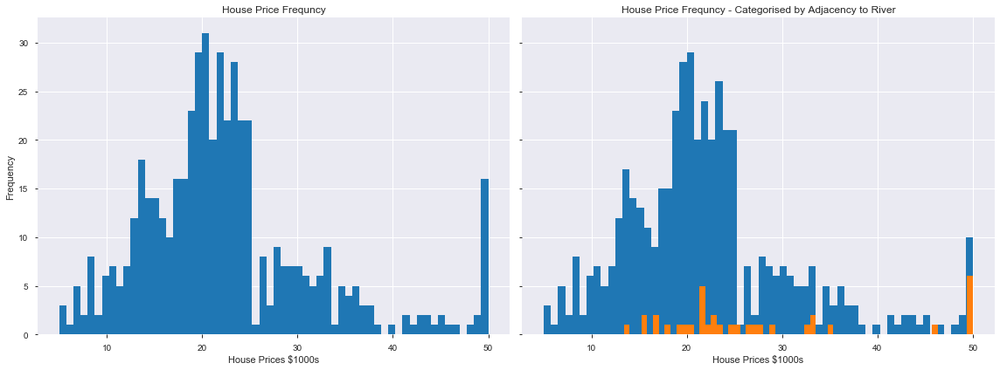

In [11]:

# PLotting histograms showing House Prices in total 
# and where the zone is beside the river
plt.rcParams['figure.figsize'] = [16, 6]
fig, axs = plt.subplots(1, 2, sharey=True, tight_layout=True)
axs[0].set_xlabel('House Prices $1000s')
axs[1].set_xlabel('House Prices $1000s')
axs[0].set_ylabel('Frequency')
axs[0].set_title("House Price Frequncy")
axs[1].set_title("House Price Frequncy - Categorised by Adjacency to River")
axs[0].hist(boston["MEDV"], bins = 60)
axs[1].hist(boston["MEDV"].where(boston['CHAS'] == 0.0), bins = 60)
axs[1].hist(boston["MEDV"].where(boston['CHAS'] == 1.0), bins = 60)

# Tweak spacing to prevent clipping of ylabel
fig.tight_layout()
plt.show()

In [12]:
#Just having a look at the house price element itself
boston["MEDV"].describe()

count    506.000000
mean      22.532806
std        9.197104
min        5.000000
25%       17.025000
50%       21.200000
75%       25.000000
max       50.000000
Name: MEDV, dtype: float64

### What affects house prices? ###
Need to look at each element individually forst to see what affects house prices in particular:  
- CRIM per capita crime rate by town
- ZN proportion of residential land zoned for lots over 25,000 sq.ft.
- INDUS proportion of non-retail business acres per town
- NOX nitric oxides concentration (parts per 10 million)
- RM average number of rooms per dwelling
- AGE proportion of owner-occupied units built prior to 1940
- DIS weighted distances to five Boston employment centres
- RAD index of accessibility to radial highways
- TAX full-value property-tax rate per $10,000
- PTRATIO pupil-teacher ratio by town
- B 1000(Bk - 0.63)^2 where Bk is the proportion of blacks by town
- LSTAT % lower status of the population

In [13]:
from scipy import stats
# Get the regression line using all the data
crim_slope, crim_intercept, crim_r2, crim_p, crim_stdErr = stats.linregress(boston["MEDV"], boston["CRIM"])
zn_slope, zn_intercept, zn_r2, zn_p, zn_stdErr = stats.linregress(boston["MEDV"], boston["ZN"])
indus_slope, indus_intercept, indus_r2, indus_p, indus_stdErr = stats.linregress(boston["MEDV"], boston["INDUS"])
nox_slope, nox_intercept, nox_r2, nox_p, nox_stdErr = stats.linregress(boston["MEDV"], boston["NOX"])
rm_slope, rm_intercept, rm_r2, rm_p, rm_stdErr = stats.linregress(boston["MEDV"], boston["RM"])
age_slope, age_intercept, age_r2, age_p, age_stdErr = stats.linregress(boston["MEDV"], boston["AGE"])
dis_slope, dis_intercept, dis_r2, dis_p, dis_stdErr = stats.linregress(boston["MEDV"], boston["DIS"])
rad_slope, rad_intercept, rad_r2, rad_p, rad_stdErr = stats.linregress(boston["MEDV"], boston["RAD"])
tax_slope, tax_intercept, tax_r2, tax_p, tax_stdErr = stats.linregress(boston["MEDV"], boston["TAX"])
ptratio_slope, ptratio_intercept, ptratio_r2, ptratio_p, ptratio_stdErr = stats.linregress(boston["MEDV"], boston["PTRATIO"])
b_slope, b_intercept, b_r2, b_p, b_stdErr = stats.linregress(boston["MEDV"], boston["B"])
lstat_slope, lstat_intercept, lstat_r2, lstat_p, lstat_stdErr = stats.linregress(boston["MEDV"], boston["LSTAT"])

In [14]:
from tabulate import tabulate

In [15]:
table = [["CRIM",crim_slope,crim_intercept, crim_r2, crim_p, crim_stdErr], \
         ["ZN", zn_slope, zn_intercept, zn_r2, zn_p, zn_stdErr], \
         ["INDUS", indus_slope, indus_intercept, indus_r2, indus_p, indus_stdErr], \
         ["NOX", nox_slope, nox_intercept, nox_r2, nox_p, nox_stdErr], \
         ["RM", rm_slope, rm_intercept, rm_r2, rm_p, rm_stdErr], \
         ["AGE", age_slope, age_intercept, age_r2, age_p, age_stdErr], \
         ["DIS", dis_slope, dis_intercept, dis_r2, dis_p, dis_stdErr], \
         ["RAD", rad_slope, rad_intercept, rad_r2, rad_p, rad_stdErr], \
         ["TAX", tax_slope, tax_intercept, tax_r2, tax_p, tax_stdErr], \
         ["PTRATIO", ptratio_slope, ptratio_intercept, ptratio_r2, ptratio_p, ptratio_stdErr], \
         ["B", b_slope, b_intercept, b_r2, b_p, b_stdErr], \
         ["LSTAT", lstat_slope, lstat_intercept, lstat_r2, lstat_p, lstat_stdErr]]
hdr = ["Category", "Slope", "Intercept", "R^2 Value", "P-Value", "Std Error"]
print(tabulate(table, headers = hdr,  tablefmt="grid"))

+------------+-------------+-------------+-------------+-------------+-------------+
| Category   |       Slope |   Intercept |   R^2 Value |     P-Value |   Std Error |
+============+=============+=============+=============+=============+=============+
| CRIM       | -0.36316    |   11.7965   |   -0.388305 | 1.17399e-19 | 0.0383902   |
+------------+-------------+-------------+-------------+-------------+-------------+
| ZN         |  0.914034   |   -9.23212  |    0.360445 | 5.71358e-17 | 0.105363    |
+------------+-------------+-------------+-------------+-------------+-------------+
| INDUS      | -0.360823   |   19.2671   |   -0.483725 | 4.90026e-31 | 0.0290802   |
+------------+-------------+-------------+-------------+-------------+-------------+
| NOX        | -0.00538397 |    0.676011 |   -0.427321 | 7.06504e-24 | 0.000507399 |
+------------+-------------+-------------+-------------+-------------+-------------+
| RM         |  0.0531224  |    5.08764  |    0.69536  | 2.48723e

The table above shows the best correlations with LSTAT (% of population from lower status), which shows an inverse relationship with house price, and RM (number of rooms). This correlates well with the Correlation tables in the profile above. 

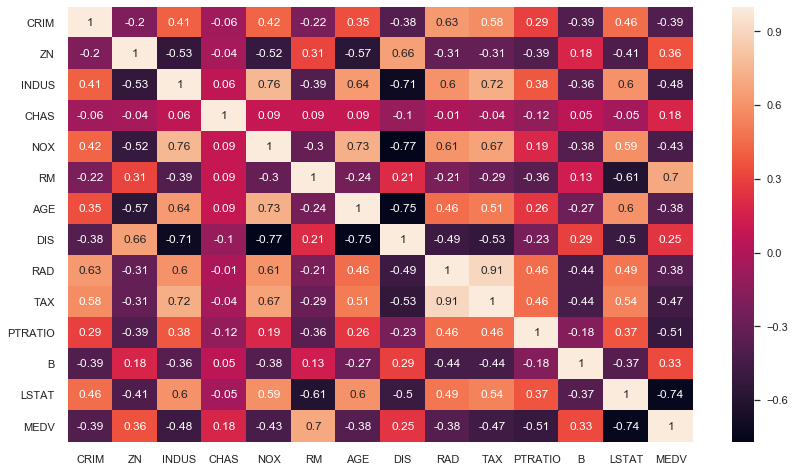

In [16]:
sns.set(rc={'figure.figsize':(14,8)})
# Look at the correlation matrix - tallies well with results above.
correlation_matrix = boston.corr().round(2)
# annot = True to print the values inside the square
sns.heatmap(data=correlation_matrix, annot=True)

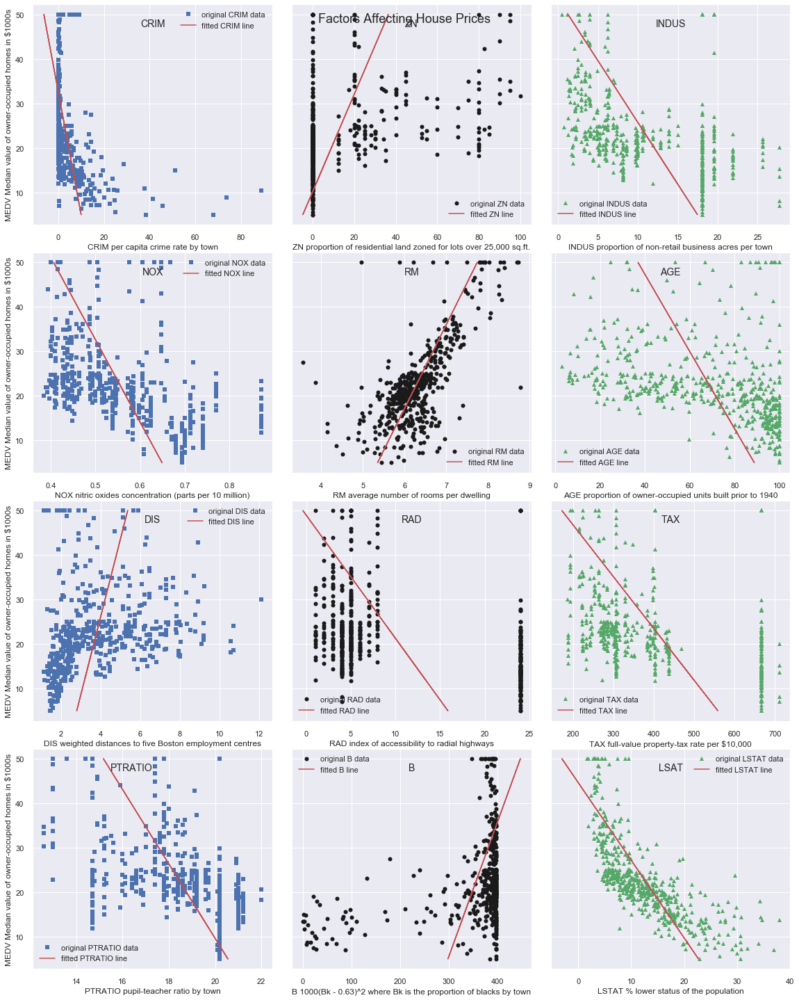

In [17]:
plt.rcParams['figure.figsize'] = [16,20]

# Plot both the raw data and the "best fit" lines
fig, ((ax1, ax2, ax3), (ax4, ax5, ax6), ( ax7, ax8, ax9), (ax10, ax11, ax12)) = plt.subplots(4, 3, sharey=True)
fig.tight_layout()

ax1.plot(boston["CRIM"], boston["MEDV"], 'bs', label='original CRIM data')
ax1.plot(crim_intercept + crim_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted CRIM line')
ax1.legend()
ax2.plot(boston["ZN"], boston["MEDV"], 'ko', label='original ZN data')
ax2.plot(zn_intercept + zn_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted ZN line')
ax2.legend()
ax3.plot(boston["INDUS"], boston["MEDV"], 'g^', label='original INDUS data')
ax3.plot(indus_intercept + indus_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted INDUS line')
ax3.legend()
ax4.plot(boston["NOX"], boston["MEDV"], 'bs', label='original NOX data')
ax4.plot(nox_intercept + nox_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted NOX line')
ax4.legend()
ax5.plot(boston["RM"], boston["MEDV"], 'ko', label='original RM data')
ax5.plot(rm_intercept + rm_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted RM line')
ax5.legend()
ax6.plot(boston["AGE"], boston["MEDV"], 'g^', label='original AGE data')
ax6.plot(age_intercept + age_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted AGE line')
ax6.legend()
ax7.plot(boston["DIS"], boston["MEDV"], 'bs', label='original DIS data')
ax7.plot(dis_intercept + dis_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted DIS line')
ax7.legend()
ax8.plot(boston["RAD"], boston["MEDV"], 'ko', label='original RAD data')
ax8.plot(rad_intercept + rad_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted RAD line')
ax8.legend()
ax9.plot(boston["TAX"], boston["MEDV"], 'g^', label='original TAX data')
ax9.plot(tax_intercept + tax_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted TAX line')
ax9.legend()
ax10.plot(boston["PTRATIO"], boston["MEDV"], 'bs', label='original PTRATIO data')
ax10.plot(ptratio_intercept + ptratio_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted PTRATIO line')
ax10.legend()
ax11.plot(boston["B"], boston["MEDV"], 'ko', label='original B data')
ax11.plot(b_intercept + b_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted B line')
ax11.legend()
ax12.plot(boston["LSTAT"], boston["MEDV"], 'g^', label='original LSTAT data')
ax12.plot(lstat_intercept + lstat_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted LSTAT line')
ax12.legend()

# Set labels
ax1.set_xlabel('CRIM per capita crime rate by town')
ax2.set_xlabel('ZN proportion of residential land zoned for lots over 25,000 sq.ft.')
ax3.set_xlabel('INDUS proportion of non-retail business acres per town')
ax4.set_xlabel('NOX nitric oxides concentration (parts per 10 million)')
ax5.set_xlabel('RM average number of rooms per dwelling')
ax6.set_xlabel('AGE proportion of owner-occupied units built prior to 1940')
ax7.set_xlabel('DIS weighted distances to five Boston employment centres')
ax8.set_xlabel('RAD index of accessibility to radial highways')
ax9.set_xlabel('TAX full-value property-tax rate per $10,000')
ax10.set_xlabel('PTRATIO pupil-teacher ratio by town')
ax11.set_xlabel('B 1000(Bk - 0.63)^2 where Bk is the proportion of blacks by town')
ax12.set_xlabel('LSTAT % lower status of the population')
ax1.set_ylabel('MEDV Median value of owner-occupied homes in $1000s')
ax4.set_ylabel('MEDV Median value of owner-occupied homes in $1000s')
ax7.set_ylabel('MEDV Median value of owner-occupied homes in $1000s')
ax10.set_ylabel('MEDV Median value of owner-occupied homes in $1000s')

# Titles
fig.suptitle('Factors Affecting House Prices', fontsize=18)

ax1.text(.5,.9,'CRIM', horizontalalignment='center',transform=ax1.transAxes,fontsize=14)
ax2.text(.5,.9,'ZN', horizontalalignment='center',transform=ax2.transAxes,fontsize=14)
ax3.text(.5,.9,'INDUS', horizontalalignment='center',transform=ax3.transAxes,fontsize=14)
ax4.text(.5,.9,'NOX', horizontalalignment='center',transform=ax4.transAxes,fontsize=14)
ax5.text(.5,.9,'RM', horizontalalignment='center',transform=ax5.transAxes,fontsize=14)
ax6.text(.5,.9,'AGE', horizontalalignment='center',transform=ax6.transAxes,fontsize=14)
ax7.text(.5,.9,'DIS', horizontalalignment='center',transform=ax7.transAxes,fontsize=14)
ax8.text(.5,.9,'RAD', horizontalalignment='center',transform=ax8.transAxes,fontsize=14)
ax9.text(.5,.9,'TAX', horizontalalignment='center',transform=ax9.transAxes,fontsize=14)
ax10.text(.5,.9,'PTRATIO', horizontalalignment='right',transform=ax10.transAxes,fontsize=14)
ax11.text(.5,.9,'B', horizontalalignment='center',transform=ax11.transAxes,fontsize=14)
ax12.text(.5,.9,'LSAT', horizontalalignment='center',transform=ax12.transAxes,fontsize=14)
plt.show()

Looking at the plots individually, we can hypothesise on possible correlations. It is likely many of these supposed correlations will be more imagined than real, but we will explore them nonetheless as this may help us spot fake relationships in the future.  
  
**CRIM**: Within the entire dataset there appears to be no relationship, but may warrant further scrutiny where the crime rate is 0.  
**ZN**: Similar to the crime rate. We could look at any relationship where the 0 values are excluded.  
**INDUS**: Could look at excluding house prices under \\$40K   
**NOX**: Similar to INDUS, could exclude the higher priced homes. Unsurprisingly this plot tallies with the INDUS plot.   
**RM**:  A clear linear proportional relationship exists.  
**AGE**: Possible relationship excluding the higher priced homes.  
**DIS**: There may be a $y = a \sqrt{x} $ relationship  
**RAD**: Struggling to find any kind of relationship here.  
**TAX**: Again, no obvious relationship barring a general trend toward higher taxes meaning lower house prices, but the data values are very spread for this to pursue.  
**PTRATIO**: Similar to the TAX plot above  
**B**: Could look at relationship excluding upper-end B values  
**LSTAT**: While this shows one of the best $r^2$ values the shape of the graph may warrant whether a $y=\frac{1}{x}$ may be a better fit here.

It is likely that many of these relationships are not worthy of further investigation.

**Investigation of adjustments described above**

In [18]:
boston_nocrim = boston.loc[boston["CRIM"] > 2]
boston_nozn = boston.loc[boston["ZN"]>5]

In [19]:
crim0_slope, crim0_intercept, crim0_r2, crim0_p, crim0_stdErr = stats.linregress(boston_nocrim["MEDV"], boston_nocrim["CRIM"])
zn0_slope, zn0_intercept, zn0_r2, zn0_p, zn0_stdErr = stats.linregress(boston_nozn["MEDV"], boston_nozn["ZN"])


In [20]:
print("Full dataset r^2 values for CRIM (", len(boston),") vs adjusted CRIM (", len(boston_nocrim),"):", crim_r2, "vs",crim0_r2)
print("Full dataset r^2 values for ZN (", len(boston),") vs adjusted ZN (", len(boston_nozn),"):", zn_r2, "vs", zn0_r2)


Full dataset r^2 values for CRIM ( 506 ) vs adjusted CRIM ( 150 ): -0.3883046085868113 vs -0.3486104206965284
Full dataset r^2 values for ZN ( 506 ) vs adjusted ZN ( 134 ): 0.3604453424505433 vs 0.20841302081053192


**Multi-Linear Regression**  
Looking at the two variables, RM and LSTAt - try using multi-linear regression

In [21]:
# Import linear_model from sklearn
import sklearn.linear_model as ln

In [22]:
# Create a linear regression model instance
m = ln.LinearRegression()

In [23]:
x = boston[["RM","LSTAT"]] # comparing against the best two variables
y = boston["MEDV"]

In [24]:
m.fit(x,y)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [25]:
# See how well it fit:
m.score(x,y)

0.6385616062603403

This value is lower than either the RM or LSTAT R2 values!

In [26]:
x = boston[["RM", "INDUS"]]
m.fit(x,y)
m.score(x,y)

0.5362984005856312

In [27]:
# And the data where is is adjacent to the river
boston["MEDV"].where(boston['CHAS'] == 1.0).describe()

count    35.000000
mean     28.440000
std      11.816643
min      13.400000
25%      21.100000
50%      23.300000
75%      33.150000
max      50.000000
Name: MEDV, dtype: float64

In [28]:
# Focus on only the Zones Where CHAS is 1
np.unique(boston[['ZN','CHAS']], axis=0)
boston["ZN"].unique()

array([ 18. ,   0. ,  12.5,  75. ,  21. ,  90. ,  85. , 100. ,  25. ,
        17.5,  80. ,  28. ,  45. ,  60. ,  95. ,  82.5,  30. ,  22. ,
        20. ,  40. ,  55. ,  52.5,  70. ,  34. ,  33. ,  35. ])

In [29]:
boston.loc[boston['CHAS'] == 1]

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
142,3.32105,0.0,19.58,1.0,0.8710,5.403,100.0,1.3216,5.0,403.0,14.7,396.90,26.82,13.4
152,1.12658,0.0,19.58,1.0,0.8710,5.012,88.0,1.6102,5.0,403.0,14.7,343.28,12.12,15.3
154,1.41385,0.0,19.58,1.0,0.8710,6.129,96.0,1.7494,5.0,403.0,14.7,321.02,15.12,17.0
155,3.53501,0.0,19.58,1.0,0.8710,6.152,82.6,1.7455,5.0,403.0,14.7,88.01,15.02,15.6
160,1.27346,0.0,19.58,1.0,0.6050,6.250,92.6,1.7984,5.0,403.0,14.7,338.92,5.50,27.0
162,1.83377,0.0,19.58,1.0,0.6050,7.802,98.2,2.0407,5.0,403.0,14.7,389.61,1.92,50.0
163,1.51902,0.0,19.58,1.0,0.6050,8.375,93.9,2.1620,5.0,403.0,14.7,388.45,3.32,50.0
208,0.13587,0.0,10.59,1.0,0.4890,6.064,59.1,4.2392,4.0,277.0,18.6,381.32,14.66,24.4
209,0.43571,0.0,10.59,1.0,0.4890,5.344,100.0,3.8750,4.0,277.0,18.6,396.90,23.09,20.0
210,0.17446,0.0,10.59,1.0,0.4890,5.960,92.1,3.8771,4.0,277.0,18.6,393.25,17.27,21.7


## (20%) Infer: ##
To the above jupyter notebook, add a section where you use inferential
statistics to analyse whether there is a significant difference in median house prices
between houses that are along the Charles river and those that aren’t. You should
explain and discuss your findings within the notebook. This part is also worth
20%.

<img src="images/Charles-River.jpg"/>

In [30]:
# Let#'s have a look at the stats for properties beside the Charles River
boston.loc[boston['CHAS'] == 1].describe()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
count,35.000000,35.000000,35.000000,35.0,35.000000,35.000000,35.00000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000
mean,1.851670,7.714286,12.719143,1.0,0.593426,6.519600,77.50000,3.029709,9.314286,386.257143,17.491429,372.997429,11.241714,28.440000
std,2.494072,18.800143,5.957623,0.0,0.144736,0.876416,22.02134,1.254728,8.248962,165.012004,2.081766,53.382820,6.686651,11.816643
min,0.015010,0.000000,1.210000,1.0,0.401000,5.012000,24.80000,1.129600,1.000000,198.000000,13.600000,88.010000,1.920000,13.400000
25%,0.125060,0.000000,6.410000,1.0,0.489000,5.935500,60.30000,1.904700,4.000000,276.000000,15.650000,376.200000,5.395000,21.100000
50%,0.447910,0.000000,13.890000,1.0,0.550000,6.250000,88.50000,3.048000,5.000000,307.000000,17.600000,390.770000,10.500000,23.300000
75%,3.397665,0.000000,18.100000,1.0,0.693000,6.915000,93.20000,3.897300,8.000000,403.000000,18.600000,393.595000,15.070000,33.150000
max,8.982960,90.000000,19.580000,1.0,0.871000,8.780000,100.00000,5.885000,24.000000,666.000000,20.200000,396.900000,26.820000,50.000000


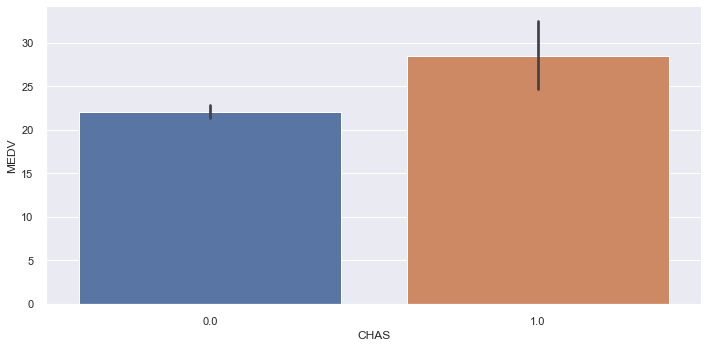

In [31]:
sns.catplot(height=5, aspect=2, x = 'CHAS', y ='MEDV', data = boston, kind = "bar")

In [32]:
boston.loc[boston['CHAS'] == 1]["MEDV"].describe()

count    35.000000
mean     28.440000
std      11.816643
min      13.400000
25%      21.100000
50%      23.300000
75%      33.150000
max      50.000000
Name: MEDV, dtype: float64

In [33]:
boston.loc[boston['CHAS'] == 0]["MEDV"].describe()

count    471.000000
mean      22.093843
std        8.831362
min        5.000000
25%       16.600000
50%       20.900000
75%       24.800000
max       50.000000
Name: MEDV, dtype: float64

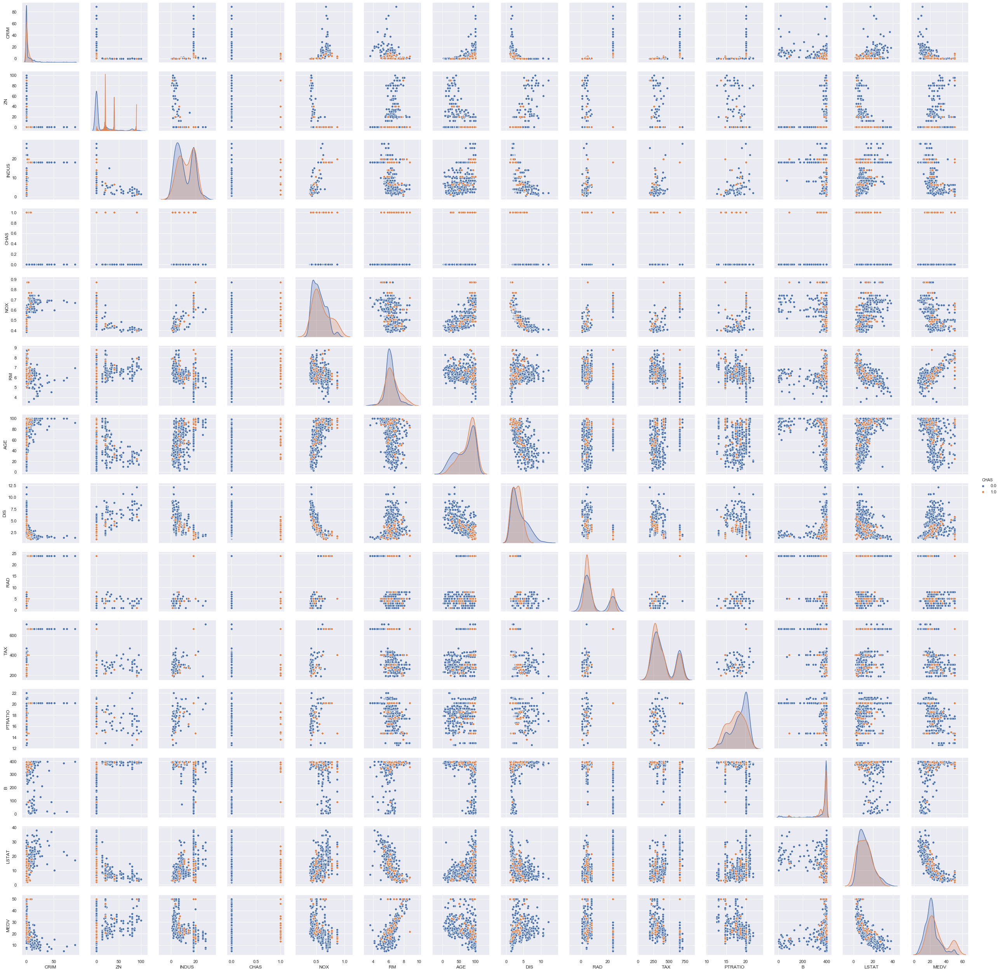

In [34]:
# A 14 x14 plot! 
sns.pairplot(boston, hue = "CHAS")

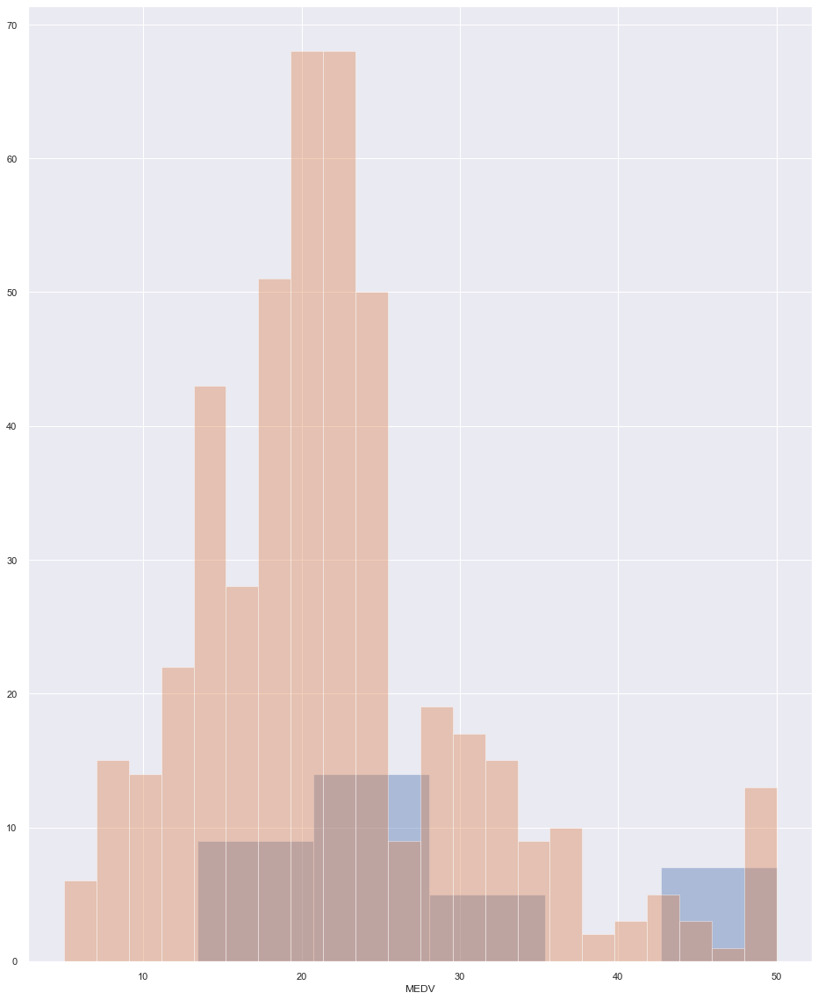

In [35]:
sns.distplot(boston.loc[boston['CHAS'] == 1]["MEDV"],  kde=False,label='Next to River')
sns.distplot(boston.loc[boston['CHAS'] != 1]["MEDV"],  kde=False,label='Not Next to River')

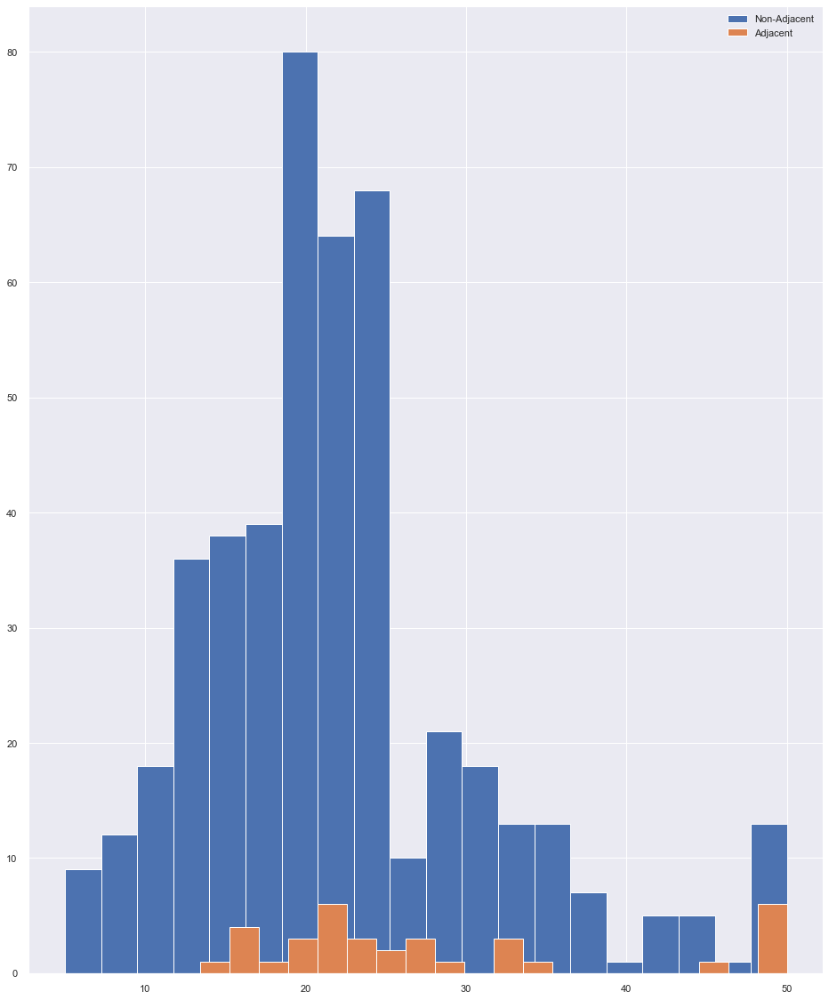

In [36]:
plt.hist(boston.loc[boston['CHAS'] != 1]["MEDV"], label='Non-Adjacent', bins = 20)
plt.hist(boston.loc[boston['CHAS'] == 1]["MEDV"], label='Adjacent', bins = 20)

plt.legend()

plt.show()

In [37]:
# Perform t-test on the two datasets:
import scipy.stats as stats
stats.ttest_ind(boston.loc[boston['CHAS'] == 1]["MEDV"], boston.loc[boston['CHAS'] == 0]["MEDV"])

Ttest_indResult(statistic=3.996437466090509, pvalue=7.390623170519905e-05)

The result above would indicate that these datasets were distinctly different with only a very small probability of the two being confused (p-value of 7.4 x 10^-5). This would appear at odds with the visual appearance of the histogram above however.  

Taking a closer look at the histogram - there appears to be a large amount of outliers in those houses adjacent to the Charles River.

In [38]:
#boston.loc[boston["MEDV"]<50.0, boston['CHAS'] == 1 ]["MEDV"]
no_chas = boston.loc[boston['CHAS'] == 0]
yes_chas = boston.loc[boston['CHAS'] == 1]

In [39]:
# Perform t-test on the two amended datasets:
stats.ttest_ind(no_chas.loc[no_chas['MEDV'] < 50.0]["MEDV"],yes_chas.loc[yes_chas["MEDV"] < 50.0]["MEDV"])

Ttest_indResult(statistic=-1.6571053443179937, pvalue=0.09814089320087695)

**Outliers**  
It is clear from the analysis to date that there appears to be a problem with the data at the higher end of the MEDV pricing. The upper limit of values appears capped at $50K. 

In [40]:
print(f"The number of rows with a MEDV value of $50K is {len(boston.loc[boston['MEDV'] == 50.0])}, which represents {len(boston.loc[boston['MEDV'] == 50.0])*100/len(boston)}% of the values")

The number of rows with a MEDV value of $50K is 16, which represents 3.1620553359683794% of the values


In [41]:
# List the top 5 most frequent house prices
boston['MEDV'].value_counts().head()

50.0    16
25.0     8
23.1     7
21.7     7
22.0     7
Name: MEDV, dtype: int64

This is at twice the frequency of any and every other value. It is likely that there was a cap put on the upper end of the MEDV values and as such this contaminates the dataset. We have no way of knowing if the \\$50K is really \\$50K or \\$50M or more. We must therefore exclude these values from further analysis.   

Rather than just pick on this value we will exclude values that fall outside two standard deviations of the mean. This should to exclude any other less obvious issues.

In [42]:
# Remove all rows where the specified column is +/- sd standard deviations
def remove_outliers(df, name, sd):
    drop_rows = df.index[(np.abs(df[name] - df[name].mean())
                          >= (sd * df[name].std()))]
    df.drop(drop_rows, axis=0, inplace=True)

In [43]:
remove_outliers(boston, "MEDV", 2)


Re-analysis

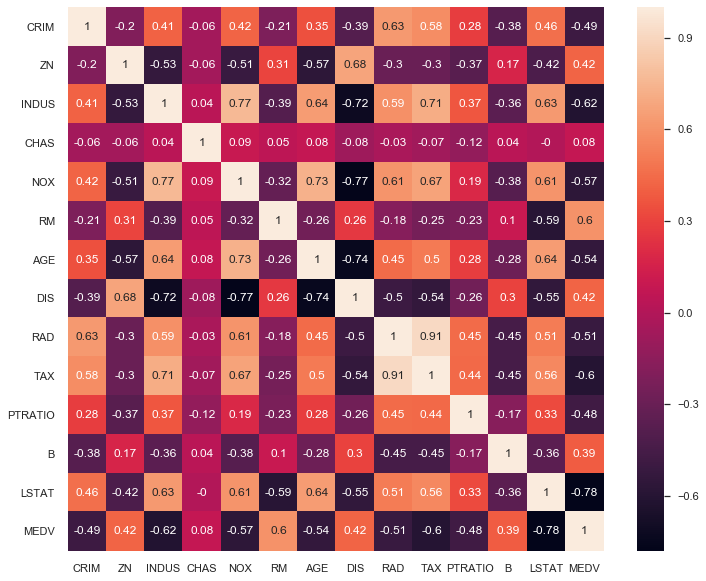

In [44]:
sns.set(rc={'figure.figsize':(12,10)})
# Look at the correlation matrix - tallies well with results above.
correlation_matrix = boston.corr().round(2)
# annot = True to print the values inside the square
sns.heatmap(data=correlation_matrix, annot=True)

In [45]:
# Get the regression lines using the non-outlier data
crim_slope, crim_intercept, crim_r2, crim_p, crim_stdErr = stats.linregress(boston["MEDV"], boston["CRIM"])
zn_slope, zn_intercept, zn_r2, zn_p, zn_stdErr = stats.linregress(boston["MEDV"], boston["ZN"])
indus_slope, indus_intercept, indus_r2, indus_p, indus_stdErr = stats.linregress(boston["MEDV"], boston["INDUS"])
nox_slope, nox_intercept, nox_r2, nox_p, nox_stdErr = stats.linregress(boston["MEDV"], boston["NOX"])
rm_slope, rm_intercept, rm_r2, rm_p, rm_stdErr = stats.linregress(boston["MEDV"], boston["RM"])
age_slope, age_intercept, age_r2, age_p, age_stdErr = stats.linregress(boston["MEDV"], boston["AGE"])
dis_slope, dis_intercept, dis_r2, dis_p, dis_stdErr = stats.linregress(boston["MEDV"], boston["DIS"])
rad_slope, rad_intercept, rad_r2, rad_p, rad_stdErr = stats.linregress(boston["MEDV"], boston["RAD"])
tax_slope, tax_intercept, tax_r2, tax_p, tax_stdErr = stats.linregress(boston["MEDV"], boston["TAX"])
ptratio_slope, ptratio_intercept, ptratio_r2, ptratio_p, ptratio_stdErr = stats.linregress(boston["MEDV"], boston["PTRATIO"])
b_slope, b_intercept, b_r2, b_p, b_stdErr = stats.linregress(boston["MEDV"], boston["B"])
lstat_slope, lstat_intercept, lstat_r2, lstat_p, lstat_stdErr = stats.linregress(boston["MEDV"], boston["LSTAT"])

Removing the outliers has a significant effect on the correlation coefficients with respect to MEDV. Previously, with the outliers included only LSTAT (-0.74), RM (0.7) and PTRATIO (-0.51) had absolute coefficients greater than 0.5. With the outliers removed INDUS(-0.62), NOX(-0.57), AGE (-0.54), RAD(-0.51), TAX (-0.6) are also included in that list. Interestingly however PTRATIO has decreased to -0.48 and RM, one of the two most highly correlated variables has decreased to 0.6 from 0.7.

In [46]:
table = [["CRIM",crim_slope,crim_intercept, crim_r2, crim_p, crim_stdErr], \
         ["ZN", zn_slope, zn_intercept, zn_r2, zn_p, zn_stdErr], \
         ["INDUS", indus_slope, indus_intercept, indus_r2, indus_p, indus_stdErr], \
         ["NOX", nox_slope, nox_intercept, nox_r2, nox_p, nox_stdErr], \
         ["RM", rm_slope, rm_intercept, rm_r2, rm_p, rm_stdErr], \
         ["AGE", age_slope, age_intercept, age_r2, age_p, age_stdErr], \
         ["DIS", dis_slope, dis_intercept, dis_r2, dis_p, dis_stdErr], \
         ["RAD", rad_slope, rad_intercept, rad_r2, rad_p, rad_stdErr], \
         ["TAX", tax_slope, tax_intercept, tax_r2, tax_p, tax_stdErr], \
         ["PTRATIO", ptratio_slope, ptratio_intercept, ptratio_r2, ptratio_p, ptratio_stdErr], \
         ["B", b_slope, b_intercept, b_r2, b_p, b_stdErr], \
         ["LSTAT", lstat_slope, lstat_intercept, lstat_r2, lstat_p, lstat_stdErr]]
hdr = ["Category", "Slope", "Intercept", "R^2 Value", "P-Value", "Std Error"]
print(tabulate(table, headers = hdr,  tablefmt="grid"))

+------------+--------------+-------------+-------------+-------------+-------------+
| Category   |        Slope |   Intercept |   R^2 Value |     P-Value |   Std Error |
+============+==============+=============+=============+=============+=============+
| CRIM       |  -0.634937   |   17.0222   |   -0.488403 | 7.62853e-30 | 0.0521609   |
+------------+--------------+-------------+-------------+-------------+-------------+
| ZN         |   1.37515    |  -18.1065   |    0.419465 | 1.14894e-21 | 0.136836    |
+------------+--------------+-------------+-------------+-------------+-------------+
| INDUS      |  -0.621985   |   24.2989   |   -0.620829 | 5.85041e-52 | 0.036113    |
+------------+--------------+-------------+-------------+-------------+-------------+
| NOX        |  -0.00983621 |    0.761699 |   -0.5706   | 2.22557e-42 | 0.000650922 |
+------------+--------------+-------------+-------------+-------------+-------------+
| RM         |   0.0527443  |    5.09299  |    0.60275

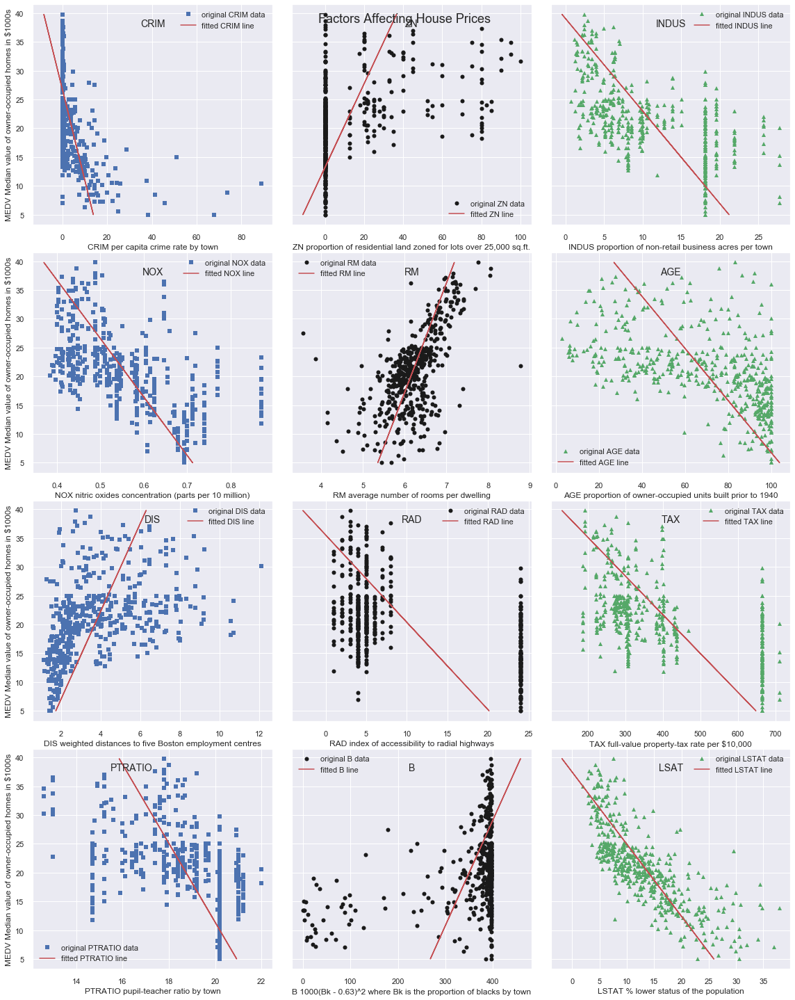

In [47]:
plt.rcParams['figure.figsize'] = [16,20]

# Plot both the raw data and the "best fit" lines
fig, ((ax1, ax2, ax3), (ax4, ax5, ax6), ( ax7, ax8, ax9), (ax10, ax11, ax12)) = plt.subplots(4, 3, sharey=True)
fig.tight_layout()

ax1.plot(boston["CRIM"], boston["MEDV"], 'bs', label='original CRIM data')
ax1.plot(crim_intercept + crim_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted CRIM line')
ax1.legend()
ax2.plot(boston["ZN"], boston["MEDV"], 'ko', label='original ZN data')
ax2.plot(zn_intercept + zn_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted ZN line')
ax2.legend()
ax3.plot(boston["INDUS"], boston["MEDV"], 'g^', label='original INDUS data')
ax3.plot(indus_intercept + indus_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted INDUS line')
ax3.legend()
ax4.plot(boston["NOX"], boston["MEDV"], 'bs', label='original NOX data')
ax4.plot(nox_intercept + nox_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted NOX line')
ax4.legend()
ax5.plot(boston["RM"], boston["MEDV"], 'ko', label='original RM data')
ax5.plot(rm_intercept + rm_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted RM line')
ax5.legend()
ax6.plot(boston["AGE"], boston["MEDV"], 'g^', label='original AGE data')
ax6.plot(age_intercept + age_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted AGE line')
ax6.legend()
ax7.plot(boston["DIS"], boston["MEDV"], 'bs', label='original DIS data')
ax7.plot(dis_intercept + dis_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted DIS line')
ax7.legend()
ax8.plot(boston["RAD"], boston["MEDV"], 'ko', label='original RAD data')
ax8.plot(rad_intercept + rad_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted RAD line')
ax8.legend()
ax9.plot(boston["TAX"], boston["MEDV"], 'g^', label='original TAX data')
ax9.plot(tax_intercept + tax_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted TAX line')
ax9.legend()
ax10.plot(boston["PTRATIO"], boston["MEDV"], 'bs', label='original PTRATIO data')
ax10.plot(ptratio_intercept + ptratio_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted PTRATIO line')
ax10.legend()
ax11.plot(boston["B"], boston["MEDV"], 'ko', label='original B data')
ax11.plot(b_intercept + b_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted B line')
ax11.legend()
ax12.plot(boston["LSTAT"], boston["MEDV"], 'g^', label='original LSTAT data')
ax12.plot(lstat_intercept + lstat_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted LSTAT line')
ax12.legend()

# Set labels
ax1.set_xlabel('CRIM per capita crime rate by town')
ax2.set_xlabel('ZN proportion of residential land zoned for lots over 25,000 sq.ft.')
ax3.set_xlabel('INDUS proportion of non-retail business acres per town')
ax4.set_xlabel('NOX nitric oxides concentration (parts per 10 million)')
ax5.set_xlabel('RM average number of rooms per dwelling')
ax6.set_xlabel('AGE proportion of owner-occupied units built prior to 1940')
ax7.set_xlabel('DIS weighted distances to five Boston employment centres')
ax8.set_xlabel('RAD index of accessibility to radial highways')
ax9.set_xlabel('TAX full-value property-tax rate per $10,000')
ax10.set_xlabel('PTRATIO pupil-teacher ratio by town')
ax11.set_xlabel('B 1000(Bk - 0.63)^2 where Bk is the proportion of blacks by town')
ax12.set_xlabel('LSTAT % lower status of the population')
ax1.set_ylabel('MEDV Median value of owner-occupied homes in $1000s')
ax4.set_ylabel('MEDV Median value of owner-occupied homes in $1000s')
ax7.set_ylabel('MEDV Median value of owner-occupied homes in $1000s')
ax10.set_ylabel('MEDV Median value of owner-occupied homes in $1000s')

# Titles
fig.suptitle('Factors Affecting House Prices', fontsize=18)

ax1.text(.5,.9,'CRIM', horizontalalignment='center',transform=ax1.transAxes,fontsize=14)
ax2.text(.5,.9,'ZN', horizontalalignment='center',transform=ax2.transAxes,fontsize=14)
ax3.text(.5,.9,'INDUS', horizontalalignment='center',transform=ax3.transAxes,fontsize=14)
ax4.text(.5,.9,'NOX', horizontalalignment='center',transform=ax4.transAxes,fontsize=14)
ax5.text(.5,.9,'RM', horizontalalignment='center',transform=ax5.transAxes,fontsize=14)
ax6.text(.5,.9,'AGE', horizontalalignment='center',transform=ax6.transAxes,fontsize=14)
ax7.text(.5,.9,'DIS', horizontalalignment='center',transform=ax7.transAxes,fontsize=14)
ax8.text(.5,.9,'RAD', horizontalalignment='center',transform=ax8.transAxes,fontsize=14)
ax9.text(.5,.9,'TAX', horizontalalignment='center',transform=ax9.transAxes,fontsize=14)
ax10.text(.5,.9,'PTRATIO', horizontalalignment='right',transform=ax10.transAxes,fontsize=14)
ax11.text(.5,.9,'B', horizontalalignment='center',transform=ax11.transAxes,fontsize=14)
ax12.text(.5,.9,'LSAT', horizontalalignment='center',transform=ax12.transAxes,fontsize=14)
plt.show()

In [48]:
# Perform t-test on the with putliers removed:
stats.ttest_ind(boston.loc[boston['CHAS'] < 1]["MEDV"],boston.loc[boston["CHAS"] == 1.0]["MEDV"])

Ttest_indResult(statistic=-1.8389265568521393, pvalue=0.06655266530833404)

With the outliers removed - it is not possible to distinguish the two datasets.

In [49]:
import keras as ks

Using TensorFlow backend.


In [50]:
boston_all = pd.DataFrame(bhp.data, columns=bhp.feature_names)

In [51]:
from sklearn import metrics
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation
from tensorflow.keras.callbacks import EarlyStopping

In [108]:
# Divide the dataset into inputs and outputs
# Inputs = the data we know
# Output = what we are looking for
inputs_no = boston[['LSTAT', 'RM', 'INDUS', 'AGE','TAX', 'PTRATIO']]
outputs_no = boston['MEDV']
# Build the neural network
model_no = Sequential()
model_no.add(Dense(250, input_dim=inputs_no.shape[1], activation='relu')) # Hidden 1
model_no.add(Dense(50, activation='relu')) # Hidden 2
model_no.add(Dense(50, activation='elu')) # Hidden 2
model_no.add(Dense(50, activation='selu')) # Hidden 2
model_no.add(Dense(1)) # Output
model_no.compile(loss='mean_squared_error', optimizer='adam')
model_no.fit(inputs_no,outputs_no,verbose=2,epochs=1000)

#model_all.add(Dense(250, input_dim=inputs_all.shape[1], activation='relu')) # Hidden 1
#model_all.add(Dense(50, activation='linear')) # Hidden 2
#model_all.add(Dense(50, activation='relu')) # Hidden 2
#model_all.add(Dense(50, activation='relu')) # Hidden 2
#model_all.add(Dense(50, activation='relu')) # Hidden 2
#model_all.add(Dense(1)) # Output
#model_all.compile(loss='mean_squared_error', optimizer='adam')
#model_all.fit(inputs_all,outputs_all,verbose=2,epochs=500)

Train on 475 samples
Epoch 1/1000
475/475 - 0s - loss: 176.3827
Epoch 2/1000
475/475 - 0s - loss: 125.8593
Epoch 3/1000
475/475 - 0s - loss: 87.5552
Epoch 4/1000
475/475 - 0s - loss: 67.0550
Epoch 5/1000
475/475 - 0s - loss: 49.3074
Epoch 6/1000
475/475 - 0s - loss: 32.0853
Epoch 7/1000
475/475 - 0s - loss: 25.7548
Epoch 8/1000
475/475 - 0s - loss: 24.5652
Epoch 9/1000
475/475 - 0s - loss: 25.1097
Epoch 10/1000
475/475 - 0s - loss: 24.8350
Epoch 11/1000
475/475 - 0s - loss: 21.7776
Epoch 12/1000
475/475 - 0s - loss: 24.2394
Epoch 13/1000
475/475 - 0s - loss: 24.5794
Epoch 14/1000
475/475 - 0s - loss: 19.3108
Epoch 15/1000
475/475 - 0s - loss: 19.3290
Epoch 16/1000
475/475 - 0s - loss: 21.6334
Epoch 17/1000
475/475 - 0s - loss: 18.0180
Epoch 18/1000
475/475 - 0s - loss: 18.0552
Epoch 19/1000
475/475 - 0s - loss: 18.9225
Epoch 20/1000
475/475 - 0s - loss: 25.6720
Epoch 21/1000
475/475 - 0s - loss: 21.2149
Epoch 22/1000
475/475 - 0s - loss: 23.1288
Epoch 23/1000
475/475 - 0s - loss: 22.87

Epoch 186/1000
475/475 - 0s - loss: 9.5236
Epoch 187/1000
475/475 - 0s - loss: 9.8250
Epoch 188/1000
475/475 - 0s - loss: 9.4560
Epoch 189/1000
475/475 - 0s - loss: 9.3971
Epoch 190/1000
475/475 - 0s - loss: 10.4977
Epoch 191/1000
475/475 - 0s - loss: 9.9274
Epoch 192/1000
475/475 - 0s - loss: 10.3161
Epoch 193/1000
475/475 - 0s - loss: 8.6266
Epoch 194/1000
475/475 - 0s - loss: 9.1146
Epoch 195/1000
475/475 - 0s - loss: 9.1309
Epoch 196/1000
475/475 - 0s - loss: 9.8509
Epoch 197/1000
475/475 - 0s - loss: 10.0954
Epoch 198/1000
475/475 - 0s - loss: 9.0244
Epoch 199/1000
475/475 - 0s - loss: 9.8176
Epoch 200/1000
475/475 - 0s - loss: 9.7813
Epoch 201/1000
475/475 - 0s - loss: 9.8929
Epoch 202/1000
475/475 - 0s - loss: 9.4186
Epoch 203/1000
475/475 - 0s - loss: 8.8716
Epoch 204/1000
475/475 - 0s - loss: 8.9271
Epoch 205/1000
475/475 - 0s - loss: 9.3950
Epoch 206/1000
475/475 - 0s - loss: 9.6323
Epoch 207/1000
475/475 - 0s - loss: 10.3581
Epoch 208/1000
475/475 - 0s - loss: 9.4070
Epoch 2

Epoch 376/1000
475/475 - 0s - loss: 7.7687
Epoch 377/1000
475/475 - 0s - loss: 7.9526
Epoch 378/1000
475/475 - 0s - loss: 7.5302
Epoch 379/1000
475/475 - 0s - loss: 8.5554
Epoch 380/1000
475/475 - 0s - loss: 8.0793
Epoch 381/1000
475/475 - 0s - loss: 7.5180
Epoch 382/1000
475/475 - 0s - loss: 8.3706
Epoch 383/1000
475/475 - 0s - loss: 9.2755
Epoch 384/1000
475/475 - 0s - loss: 8.4646
Epoch 385/1000
475/475 - 0s - loss: 8.3039
Epoch 386/1000
475/475 - 0s - loss: 8.9987
Epoch 387/1000
475/475 - 0s - loss: 8.8847
Epoch 388/1000
475/475 - 0s - loss: 7.5237
Epoch 389/1000
475/475 - 0s - loss: 7.0362
Epoch 390/1000
475/475 - 0s - loss: 8.3797
Epoch 391/1000
475/475 - 0s - loss: 10.7085
Epoch 392/1000
475/475 - 0s - loss: 9.1803
Epoch 393/1000
475/475 - 0s - loss: 9.6207
Epoch 394/1000
475/475 - 0s - loss: 9.0788
Epoch 395/1000
475/475 - 0s - loss: 9.6705
Epoch 396/1000
475/475 - 0s - loss: 9.8817
Epoch 397/1000
475/475 - 0s - loss: 9.9745
Epoch 398/1000
475/475 - 0s - loss: 9.3371
Epoch 399/

Epoch 567/1000
475/475 - 0s - loss: 5.8994
Epoch 568/1000
475/475 - 0s - loss: 5.9371
Epoch 569/1000
475/475 - 0s - loss: 5.8131
Epoch 570/1000
475/475 - 0s - loss: 6.4378
Epoch 571/1000
475/475 - 0s - loss: 6.1128
Epoch 572/1000
475/475 - 0s - loss: 5.9622
Epoch 573/1000
475/475 - 0s - loss: 5.7074
Epoch 574/1000
475/475 - 0s - loss: 6.1784
Epoch 575/1000
475/475 - 0s - loss: 6.2450
Epoch 576/1000
475/475 - 0s - loss: 6.9915
Epoch 577/1000
475/475 - 0s - loss: 7.0229
Epoch 578/1000
475/475 - 0s - loss: 6.2969
Epoch 579/1000
475/475 - 0s - loss: 6.0762
Epoch 580/1000
475/475 - 0s - loss: 6.3603
Epoch 581/1000
475/475 - 0s - loss: 7.0467
Epoch 582/1000
475/475 - 0s - loss: 6.6566
Epoch 583/1000
475/475 - 0s - loss: 5.9153
Epoch 584/1000
475/475 - 0s - loss: 5.8306
Epoch 585/1000
475/475 - 0s - loss: 5.8894
Epoch 586/1000
475/475 - 0s - loss: 6.7823
Epoch 587/1000
475/475 - 0s - loss: 6.1992
Epoch 588/1000
475/475 - 0s - loss: 5.7712
Epoch 589/1000
475/475 - 0s - loss: 5.8267
Epoch 590/1

Epoch 758/1000
475/475 - 0s - loss: 4.8541
Epoch 759/1000
475/475 - 0s - loss: 4.8041
Epoch 760/1000
475/475 - 0s - loss: 4.6442
Epoch 761/1000
475/475 - 0s - loss: 4.9614
Epoch 762/1000
475/475 - 0s - loss: 6.4046
Epoch 763/1000
475/475 - 0s - loss: 5.2602
Epoch 764/1000
475/475 - 0s - loss: 5.1722
Epoch 765/1000
475/475 - 0s - loss: 5.2882
Epoch 766/1000
475/475 - 0s - loss: 5.3746
Epoch 767/1000
475/475 - 0s - loss: 6.2021
Epoch 768/1000
475/475 - 0s - loss: 6.6164
Epoch 769/1000
475/475 - 0s - loss: 5.8817
Epoch 770/1000
475/475 - 0s - loss: 5.4447
Epoch 771/1000
475/475 - 0s - loss: 5.3017
Epoch 772/1000
475/475 - 0s - loss: 4.8392
Epoch 773/1000
475/475 - 0s - loss: 4.8349
Epoch 774/1000
475/475 - 0s - loss: 4.5960
Epoch 775/1000
475/475 - 0s - loss: 4.7313
Epoch 776/1000
475/475 - 0s - loss: 4.6016
Epoch 777/1000
475/475 - 0s - loss: 4.8775
Epoch 778/1000
475/475 - 0s - loss: 6.4004
Epoch 779/1000
475/475 - 0s - loss: 5.4546
Epoch 780/1000
475/475 - 0s - loss: 5.1172
Epoch 781/1

Epoch 949/1000
475/475 - 0s - loss: 4.5599
Epoch 950/1000
475/475 - 0s - loss: 4.5439
Epoch 951/1000
475/475 - 0s - loss: 4.3829
Epoch 952/1000
475/475 - 0s - loss: 4.9353
Epoch 953/1000
475/475 - 0s - loss: 4.6057
Epoch 954/1000
475/475 - 0s - loss: 5.3782
Epoch 955/1000
475/475 - 0s - loss: 4.8744
Epoch 956/1000
475/475 - 0s - loss: 4.5582
Epoch 957/1000
475/475 - 0s - loss: 4.1784
Epoch 958/1000
475/475 - 0s - loss: 3.9942
Epoch 959/1000
475/475 - 0s - loss: 4.0296
Epoch 960/1000
475/475 - 0s - loss: 4.3686
Epoch 961/1000
475/475 - 0s - loss: 4.6601
Epoch 962/1000
475/475 - 0s - loss: 5.9116
Epoch 963/1000
475/475 - 0s - loss: 4.5641
Epoch 964/1000
475/475 - 0s - loss: 4.3434
Epoch 965/1000
475/475 - 0s - loss: 4.0560
Epoch 966/1000
475/475 - 0s - loss: 4.3241
Epoch 967/1000
475/475 - 0s - loss: 3.9814
Epoch 968/1000
475/475 - 0s - loss: 4.5877
Epoch 969/1000
475/475 - 0s - loss: 4.2111
Epoch 970/1000
475/475 - 0s - loss: 4.3461
Epoch 971/1000
475/475 - 0s - loss: 4.5902
Epoch 972/1

In [87]:
pred_no = model_no.predict(inputs_no)
print("Shape: {}".format(pred_no.shape))
print(pred_no)

Shape: (475, 1)
[[26.571737 ]
 [21.473806 ]
 [34.65279  ]
 [34.815735 ]
 [34.958416 ]
 [30.50802  ]
 [21.448074 ]
 [26.690065 ]
 [17.354193 ]
 [19.587221 ]
 [20.509253 ]
 [19.743444 ]
 [21.343065 ]
 [19.793663 ]
 [16.862778 ]
 [18.942047 ]
 [23.055967 ]
 [16.869854 ]
 [20.861755 ]
 [17.942495 ]
 [12.393574 ]
 [16.268444 ]
 [13.318104 ]
 [14.524346 ]
 [14.726058 ]
 [13.912562 ]
 [15.385964 ]
 [14.273623 ]
 [16.327986 ]
 [18.071087 ]
 [12.347287 ]
 [13.850707 ]
 [14.681733 ]
 [13.021672 ]
 [13.901432 ]
 [18.721838 ]
 [19.349648 ]
 [21.38618  ]
 [23.414068 ]
 [30.84014  ]
 [34.873093 ]
 [26.336481 ]
 [25.123924 ]
 [25.543928 ]
 [21.870958 ]
 [20.598068 ]
 [20.405188 ]
 [17.018034 ]
 [15.294495 ]
 [20.074564 ]
 [20.860521 ]
 [20.700315 ]
 [27.331402 ]
 [23.027906 ]
 [18.35257  ]
 [35.070408 ]
 [24.673098 ]
 [34.000317 ]
 [23.518152 ]
 [19.707685 ]
 [18.884798 ]
 [15.415158 ]
 [22.683344 ]
 [25.731836 ]
 [33.33799  ]
 [27.198114 ]
 [20.208479 ]
 [21.976698 ]
 [18.621511 ]
 [21.268372 ]
 [24

In [88]:
# Measure RMSE error.  RMSE is common for regression.
score_no = np.sqrt(metrics.mean_squared_error(pred_no,outputs_no))
print(f"Final score (RMSE): {score_no}")

Final score (RMSE): 2.031593708007374


In [89]:
# Sample predictions
for i in range(10):
    print(f"{i+1}. LSTAT: {inputs_no['LSTAT'][i]}, RM: {inputs_no['RM'][i]} Actual MEDV: {outputs_no[i]}, predicted MEDV: {pred_no[i]}")

1. LSTAT: 4.98, RM: 6.575 Actual MEDV: 24.0, predicted MEDV: [26.571737]
2. LSTAT: 9.14, RM: 6.421 Actual MEDV: 21.6, predicted MEDV: [21.473806]
3. LSTAT: 4.03, RM: 7.185 Actual MEDV: 34.7, predicted MEDV: [34.65279]
4. LSTAT: 2.94, RM: 6.998 Actual MEDV: 33.4, predicted MEDV: [34.815735]
5. LSTAT: 5.33, RM: 7.147 Actual MEDV: 36.2, predicted MEDV: [34.958416]
6. LSTAT: 5.21, RM: 6.43 Actual MEDV: 28.7, predicted MEDV: [30.50802]
7. LSTAT: 12.43, RM: 6.012 Actual MEDV: 22.9, predicted MEDV: [21.448074]
8. LSTAT: 19.15, RM: 6.172 Actual MEDV: 27.1, predicted MEDV: [26.690065]
9. LSTAT: 29.93, RM: 5.631 Actual MEDV: 16.5, predicted MEDV: [17.354193]
10. LSTAT: 17.1, RM: 6.004 Actual MEDV: 18.9, predicted MEDV: [19.587221]


**With Outliers**

In [92]:
# Divide the dataset into inputs and outputs
# Inputs = the data we know
# Output = what we are looking for
inputs_all = boston[['LSTAT', 'RM', 'INDUS', 'AGE','TAX', 'PTRATIO']]
outputs_all = boston['MEDV']
# Build the neural network
model_all = Sequential()
model_all.add(Dense(250, input_dim=inputs_all.shape[1], activation='relu')) # Hidden 1
model_all.add(Dense(50, activation='linear')) # Hidden 2
model_all.add(Dense(50, activation='relu')) # Hidden 2
model_all.add(Dense(50, activation='relu')) # Hidden 2
model_all.add(Dense(50, activation='relu')) # Hidden 2
model_all.add(Dense(1)) # Output
model_all.compile(loss='mean_squared_error', optimizer='adam')
model_all.fit(inputs_all,outputs_all,verbose=2,epochs=500, batch_size=10)

Train on 475 samples
Epoch 1/500
475/475 - 0s - loss: 162.8992
Epoch 2/500
475/475 - 0s - loss: 103.9236
Epoch 3/500
475/475 - 0s - loss: 67.4817
Epoch 4/500
475/475 - 0s - loss: 48.3141
Epoch 5/500
475/475 - 0s - loss: 33.3710
Epoch 6/500
475/475 - 0s - loss: 29.1965
Epoch 7/500
475/475 - 0s - loss: 26.7669
Epoch 8/500
475/475 - 0s - loss: 29.1857
Epoch 9/500
475/475 - 0s - loss: 26.9019
Epoch 10/500
475/475 - 0s - loss: 24.2542
Epoch 11/500
475/475 - 0s - loss: 29.0798
Epoch 12/500
475/475 - 0s - loss: 23.2539
Epoch 13/500
475/475 - 0s - loss: 24.5292
Epoch 14/500
475/475 - 0s - loss: 24.4669
Epoch 15/500
475/475 - 0s - loss: 22.1589
Epoch 16/500
475/475 - 0s - loss: 23.7312
Epoch 17/500
475/475 - 0s - loss: 24.0930
Epoch 18/500
475/475 - 0s - loss: 22.6849
Epoch 19/500
475/475 - 0s - loss: 20.7879
Epoch 20/500
475/475 - 0s - loss: 21.3625
Epoch 21/500
475/475 - 0s - loss: 21.8027
Epoch 22/500
475/475 - 0s - loss: 20.8216
Epoch 23/500
475/475 - 0s - loss: 20.0261
Epoch 24/500
475/475

Epoch 191/500
475/475 - 0s - loss: 8.1582
Epoch 192/500
475/475 - 0s - loss: 7.5224
Epoch 193/500
475/475 - 0s - loss: 7.6112
Epoch 194/500
475/475 - 0s - loss: 9.2992
Epoch 195/500
475/475 - 0s - loss: 7.6140
Epoch 196/500
475/475 - 0s - loss: 11.1496
Epoch 197/500
475/475 - 0s - loss: 9.3771
Epoch 198/500
475/475 - 0s - loss: 10.4770
Epoch 199/500
475/475 - 0s - loss: 7.7725
Epoch 200/500
475/475 - 0s - loss: 7.4353
Epoch 201/500
475/475 - 0s - loss: 7.5510
Epoch 202/500
475/475 - 0s - loss: 8.4846
Epoch 203/500
475/475 - 0s - loss: 12.9991
Epoch 204/500
475/475 - 0s - loss: 7.7948
Epoch 205/500
475/475 - 0s - loss: 7.0882
Epoch 206/500
475/475 - 0s - loss: 7.5511
Epoch 207/500
475/475 - 0s - loss: 8.1876
Epoch 208/500
475/475 - 0s - loss: 8.8316
Epoch 209/500
475/475 - 0s - loss: 7.4678
Epoch 210/500
475/475 - 0s - loss: 7.2952
Epoch 211/500
475/475 - 0s - loss: 7.3525
Epoch 212/500
475/475 - 0s - loss: 7.6997
Epoch 213/500
475/475 - 0s - loss: 8.5931
Epoch 214/500
475/475 - 0s - lo

Epoch 386/500
475/475 - 0s - loss: 6.0911
Epoch 387/500
475/475 - 0s - loss: 6.0772
Epoch 388/500
475/475 - 0s - loss: 5.9943
Epoch 389/500
475/475 - 0s - loss: 7.1312
Epoch 390/500
475/475 - 0s - loss: 6.3537
Epoch 391/500
475/475 - 0s - loss: 6.0250
Epoch 392/500
475/475 - 0s - loss: 7.2622
Epoch 393/500
475/475 - 0s - loss: 6.1291
Epoch 394/500
475/475 - 0s - loss: 5.7777
Epoch 395/500
475/475 - 0s - loss: 5.8180
Epoch 396/500
475/475 - 0s - loss: 6.1015
Epoch 397/500
475/475 - 0s - loss: 6.4281
Epoch 398/500
475/475 - 0s - loss: 6.8112
Epoch 399/500
475/475 - 0s - loss: 6.7394
Epoch 400/500
475/475 - 0s - loss: 6.3419
Epoch 401/500
475/475 - 0s - loss: 7.1754
Epoch 402/500
475/475 - 0s - loss: 7.2848
Epoch 403/500
475/475 - 0s - loss: 9.1172
Epoch 404/500
475/475 - 0s - loss: 7.1735
Epoch 405/500
475/475 - 0s - loss: 7.5431
Epoch 406/500
475/475 - 0s - loss: 6.6743
Epoch 407/500
475/475 - 0s - loss: 5.9488
Epoch 408/500
475/475 - 0s - loss: 7.1276
Epoch 409/500
475/475 - 0s - loss:

In [93]:
pred_all = model_all.predict(inputs_no)
print("Shape: {}".format(pred_all.shape))
print(pred_all)

Shape: (475, 1)
[[27.173187 ]
 [24.661743 ]
 [35.617435 ]
 [35.345417 ]
 [35.565884 ]
 [29.772013 ]
 [21.678944 ]
 [21.179377 ]
 [15.934475 ]
 [19.493597 ]
 [19.656101 ]
 [21.135632 ]
 [20.921024 ]
 [20.709991 ]
 [17.903862 ]
 [20.292126 ]
 [22.863487 ]
 [18.02219  ]
 [18.240639 ]
 [18.288046 ]
 [15.138297 ]
 [16.65641  ]
 [16.053461 ]
 [16.447182 ]
 [16.489824 ]
 [14.6133795]
 [16.24471  ]
 [16.0527   ]
 [17.772142 ]
 [19.081453 ]
 [15.7452   ]
 [15.60048  ]
 [13.281889 ]
 [14.824138 ]
 [16.888996 ]
 [19.903698 ]
 [19.426662 ]
 [21.525208 ]
 [22.294731 ]
 [30.804329 ]
 [35.977932 ]
 [25.961935 ]
 [23.647049 ]
 [24.205185 ]
 [21.438847 ]
 [20.490305 ]
 [19.497581 ]
 [16.203985 ]
 [14.102438 ]
 [19.39323  ]
 [21.022816 ]
 [23.923515 ]
 [28.997627 ]
 [23.616287 ]
 [18.109749 ]
 [36.771152 ]
 [25.966568 ]
 [33.56264  ]
 [23.58348  ]
 [20.822699 ]
 [18.105162 ]
 [17.175259 ]
 [24.093369 ]
 [25.369299 ]
 [33.38121  ]
 [27.575806 ]
 [19.39153  ]
 [21.226013 ]
 [18.167843 ]
 [20.759884 ]
 [24

In [94]:
# Measure RMSE error.  RMSE is common for regression.
score_all = np.sqrt(metrics.mean_squared_error(pred_all,outputs_all))
print(f"Final score (RMSE): {score_all}")

Final score (RMSE): 2.3851471948476686


In [95]:
# Sample predictions
for i in range(10):
    print(f"{i+1}. LSTAT: {inputs_all['LSTAT'][i]}, RM: {inputs_all['RM'][i]} Actual MEDV: {outputs_all[i]}, predicted MEDV: {pred_all[i]}")

1. LSTAT: 4.98, RM: 6.575 Actual MEDV: 24.0, predicted MEDV: [27.173187]
2. LSTAT: 9.14, RM: 6.421 Actual MEDV: 21.6, predicted MEDV: [24.661743]
3. LSTAT: 4.03, RM: 7.185 Actual MEDV: 34.7, predicted MEDV: [35.617435]
4. LSTAT: 2.94, RM: 6.998 Actual MEDV: 33.4, predicted MEDV: [35.345417]
5. LSTAT: 5.33, RM: 7.147 Actual MEDV: 36.2, predicted MEDV: [35.565884]
6. LSTAT: 5.21, RM: 6.43 Actual MEDV: 28.7, predicted MEDV: [29.772013]
7. LSTAT: 12.43, RM: 6.012 Actual MEDV: 22.9, predicted MEDV: [21.678944]
8. LSTAT: 19.15, RM: 6.172 Actual MEDV: 27.1, predicted MEDV: [21.179377]
9. LSTAT: 29.93, RM: 5.631 Actual MEDV: 16.5, predicted MEDV: [15.934475]
10. LSTAT: 17.1, RM: 6.004 Actual MEDV: 18.9, predicted MEDV: [19.493597]


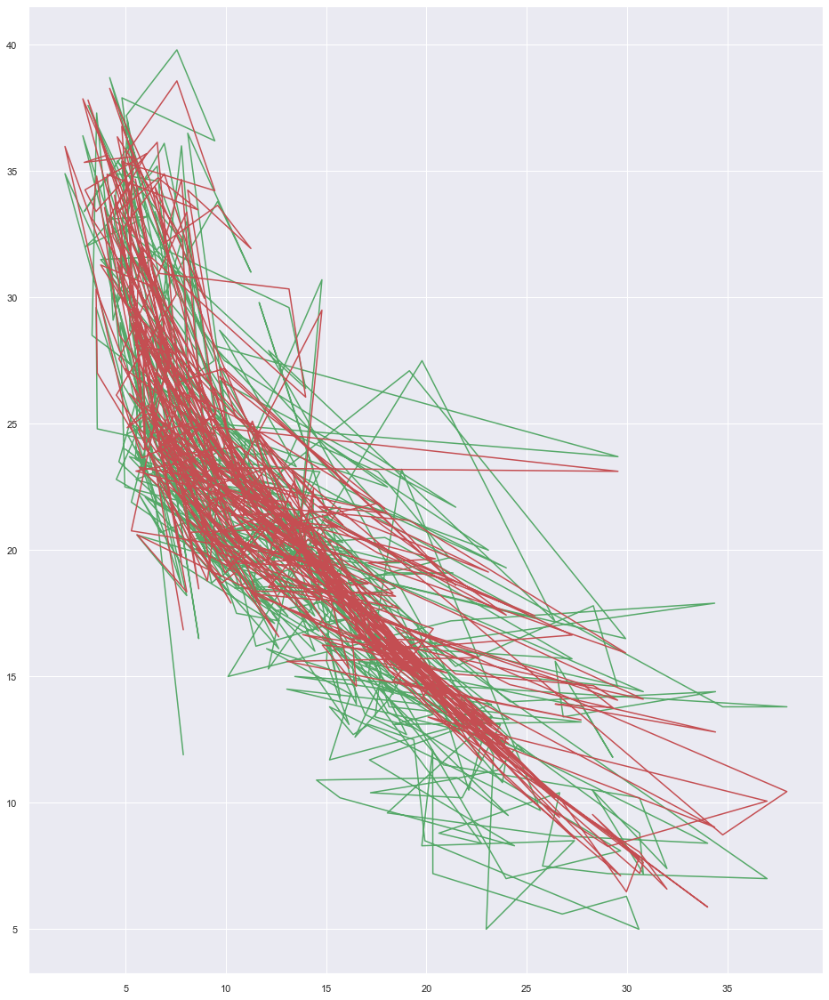

In [96]:
plt.plot(inputs_all['LSTAT'], outputs_all, "g-")
plt.plot(inputs_all['LSTAT'], pred_all, "r-")


In [97]:
a = "banana"
try:
  a = outputs_all[98]
except Exception: 
  pass
print(a)

banana


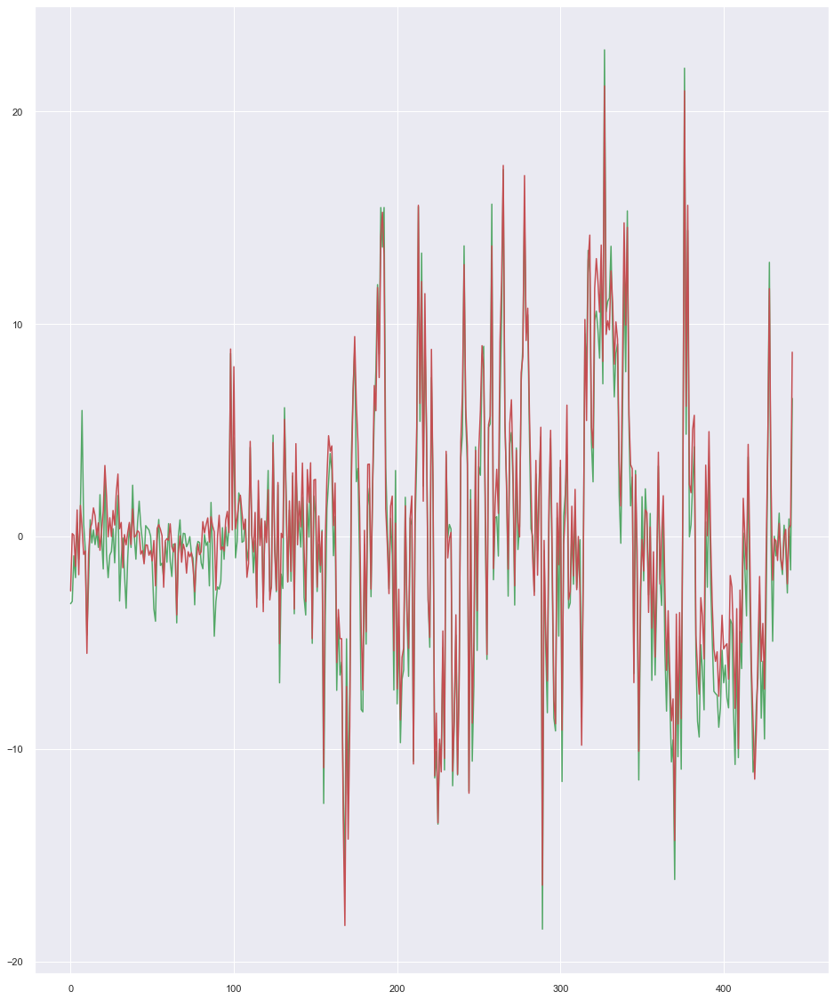

In [98]:
# Variances
var_all=[]
var_no=[]
for i in range(len(outputs_all)-1):
    try:
        var_all.append(outputs_all[i] - pred_all[i])
        var_no.append(outputs_no[i] - pred_no[i])
    except:
        pass
plt.plot(var_all, "g-")
plt.plot(var_no, "r-")

In [80]:
table = [["Mean", np.mean(var_all), np.mean(var_no)], \
         ["Minimum", np.min(var_all), np.min(var_no)], \
         ["Maximum", np.max(var_all), np.max(var_no)], \
         ["Standard Devation", np.std(var_all), np.std(var_no)]]
hdr = ["Category", "All Data", "No Outliers"]
print(tabulate(table, headers = hdr,  tablefmt="grid"))

+-------------------+------------+---------------+
| Category          |   All Data |   No Outliers |
+===================+============+===============+
| Mean              |   0.542019 |      -1.21313 |
+-------------------+------------+---------------+
| Minimum           | -15.8323   |     -16.0899  |
+-------------------+------------+---------------+
| Maximum           |  19.2417   |      21.6828  |
+-------------------+------------+---------------+
| Standard Devation |   5.62197  |       5.98761 |
+-------------------+------------+---------------+


## (60%) Predict: ##
Again using the same notebook, use keras [7] to create a neural network that can predict the median house price based on the other variables in the dataset. You are free to interpret this as you wish — for example, you may use all the other variables, or select a subset. This part is worth 60%.

## References ##
[1] Boston Standard Metropolitan Statistical Area. Boston house prices dataset. https://www.kaggle.com/c/boston-housing.  
[2] https://towardsdatascience.com/linear-regression-on-boston-housing-dataset-f409b7e4a155  
[3] https://pypi.org/project/tabulate/  
[4] Tensorflow Installation https://www.youtube.com/channel/UCR1-GEpyOPzT2AO4D_eifdw   
[5] Jeff Heaton Lecture 02-01  
[6] https://stackoverflow.com/questions/48590268/pandas-get-the-most-frequent-values-of-a-column  
[7] [Towards Data Science: My Journey into Deep Learning using Keras](https://towardsdatascience.com/my-journey-into-deeplearning-using-keras-part-1-67cbb50f65e6)  
[8] [PyImageSearch: Regression with Keras](https://www.pyimagesearch.com/2019/01/21/regression-with-keras/)  
[9] [**PyImageSearch: Keras Multiple Inputs and Mixed Data](https://www.pyimagesearch.com/2019/02/04/keras-multiple-inputs-and-mixed-data/)  
[10] [**Data Camp: Keras Tutorial - Deep Learning Python Tutorial](https://www.datacamp.com/community/tutorials/deep-learning-python)  
[11] [** Data Camp: Exploratory Data Analysis with Python](https://www.datacamp.com/community/tutorials/exploratory-data-analysis-python)  
[12] [* Towards Data Science: 4 Awesome Things You Can do With Keras](https://towardsdatascience.com/4-awesome-things-you-can-do-with-keras-and-the-code-you-need-to-make-it-happen-858f022eec85)  
[13] [* Towards Data Science: Building a Deep Learning Model Using Keras](https://towardsdatascience.com/building-a-deep-learning-model-using-keras-1548ca149d37)  
[14] [**Machine Learning Mastery: Display Deep Learning Model Training History in Keras](https://machinelearningmastery.com/display-deep-learning-model-training-history-in-keras/)  
[15] [**Towards Data Science: Exploring Activation Functions for Neural Networks](https://towardsdatascience.com/exploring-activation-functions-for-neural-networks-73498da59b02)  
[16] [**Deep Lizard: Batch Normalisation](https://deeplizard.com/learn/video/dXB-KQYkzNU)  
[17] [You Tube: Machine Learning Tutorial 1 - Linear Regression on Boston Housing Dataset | Machine Learning Basics](https://www.youtube.com/watch?v=ZeM2tHtjGy4)  
[18] [Towards Data Science: How to Increase the Accuracy of a Neural Network](https://towardsdatascience.com/how-to-increase-the-accuracy-of-a-neural-network-9f5d1c6f407d)  
[19] []()  
